In [1]:
import os
if os.getcwd().endswith("experiments"):
    os.chdir("..")

os.getcwd()

'/home/lars/code/python/context-aware-flow-matching'

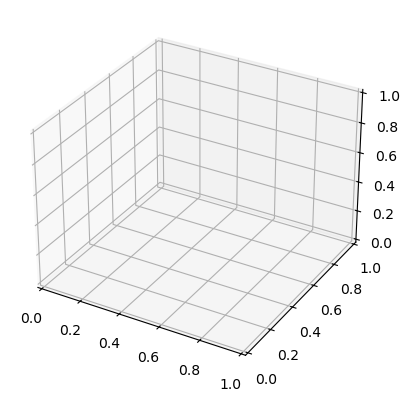

In [2]:
import torch
from torch.utils.data import random_split
from lightning import seed_everything

import numpy as np
import matplotlib.pyplot as plt

from lightning_trainable.utils import find_checkpoint

import src.utils as U
import src.visualization as viz

from src.datasets import ContextAwareFlowMatchingDataset as CAFMDataset, ModelNet10Dataset
from src.models import Model

In [3]:
torch.autograd.set_grad_enabled(False)

In [4]:
seed_everything(42)

Seed set to 42


42

In [5]:
dataset = ModelNet10Dataset("data/modelnet10")

Found non-empty ModelNet10Dataset in data, skipping download...


preloading meshes: 100%|██████████| 989/989 [00:12<00:00, 77.36it/s] 


In [6]:
train_data, val_data, test_data = random_split(dataset, [0.8, 0.1, 0.1])

In [7]:
cp = find_checkpoint(version=2)
model = Model.load_from_checkpoint(cp, map_location="cpu")
model.train_data = CAFMDataset(train_data, model.hparams.subset_size)
model.val_data = CAFMDataset(val_data, model.hparams.subset_size)
model.test_data = CAFMDataset(test_data, model.hparams.subset_size)
model = model.eval()
cp

'lightning_logs/version_2/checkpoints/last.ckpt'

In [8]:
shapes = 3
steps = 6
points = 2048
use_blender = False

features = 3

In [9]:
left, right = np.random.choice(len(model.val_data), (2, shapes), replace=False)

left = torch.stack([model.val_data[i][1] for i in left])
right = torch.stack([model.val_data[i][1] for i in right])

left.shape, right.shape

(torch.Size([10, 2048, 3]), torch.Size([10, 2048, 3]))

In [10]:
embeddings = model.encoder(torch.cat([left, right]).to(model.device))
embeddings = U.interpolate(embeddings[:shapes], embeddings[shapes:], steps=steps)
embeddings.shape

torch.Size([10, 10, 256])

In [11]:
noise = torch.randn(shapes, steps, points, features, device=model.device)
samples = model.sample_from(noise.flatten(0, 1), embeddings.flatten(0, 1), steps=250, progress=True)
samples = samples.cpu().numpy()

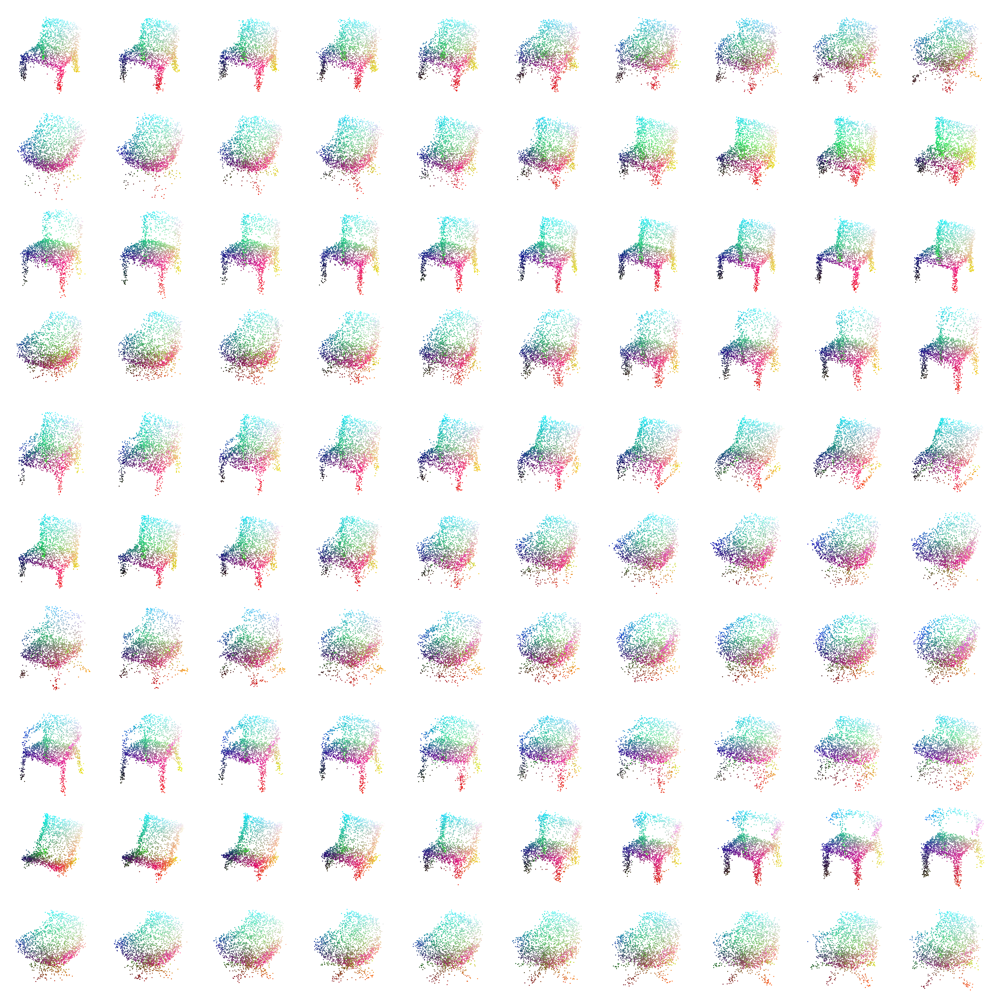

In [12]:
if use_blender:
    viz.multiscatter_bp(samples, layout=(shapes, steps))
else:
    viz.multiscatter(samples, layout=(shapes, steps))

plt.savefig("figures/interpolation.png", dpi=100, bbox_inches="tight")
plt.show()